# NBA position clustering & classification

------------------------

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt

In [2]:
pd.options.display.max_columns = 160
pd.options.display.max_rows = 350
%matplotlib inline

## 변수 정리 

col = ['Player',
 'Team',
 'Season',
 'Season Type',
 'Games',
'Min',
'Assisted 3Pts %',
'Assisted Dunk %',
'Left Corner 3 %',
'Assisted 2Pts %',
'Assists to Jump Shots PG',
'Above the Break 3 %',
'3PTM',
'Ast',
'Right Corner 3 %',
'Blk',
'Above the Break 3-Usage',
'3PTA',
'OReb',
'Tip-ins',
'Assisted Layup %',
'Assisted FG %',
'Assisted Jump Shot %',
'3+ Blk Games',
'Lost Ball Fouls',
'10+ Ast Games',
'Left Corner 3-Usage',
'Assists to 3 Pointers PG',
'Assists to Dunks PG',
'10+ Reb Games',
'Dunks',
'Assists to Layups PG',
'Right Corner 3-Usage',
'3FGM',
'Jump Shots',
'Avg. Shot Dist.',
'Restricted Area-Usage',
'Dreb',
'Bad Pass TO PG',
'Avg. Made Shot Dist.',
'In The Paint (Non-RA)-Usage',
'Double Doubles',
'3FG%',
'3FGA',
'Pts',
'Stl',
'Defensive 3 Seconds',
'3+ 3PTM Games',
'Layups',
'25+ Pts Games',
'Shooting Fouls Committed',
'3+ Stl Games',
'Assisted FG Pct.',
'Personal Fouls PG',
'Mid-Range-Usage',
"Pos"]

col = ['Player',
 'Team',
 'Season',
 'Season Type',
 'Games',
 'Above the Break 3-Usage',
 'Mid-Range-Usage',
 'In The Paint (Non-RA)-Usage',
 'Restricted Area-Usage',
 'Right Corner 3-Usage',
 'Left Corner 3-Usage',
 'Above the Break 3 %',
 'Mid-Range %',
 'In The Paint (Non-RA) %',
 'Restricted Area %',
 'Right Corner 3 %',
 'Left Corner 3 %',
 'Personal Fouls PG',
 'Charges Drawn',
 'Off. Fouls Drawn',
 'Off. Fouls',
 'Defensive 3 Seconds',
 'Shooting Fouls Committed',
 'Lost Ball Fouls',
 'Defensive Goaltendings',
 'Blocks Against',
       
 'Total Points',
 'Assisted FG Pct.',
 'Blocked FG Pct.',
 'Last Min. FGM',
 'Last Min. FGA',
 'Last Min. FG%',
 'Avg. Shot Dist.',
 'Avg. Made Shot Dist.',
       
 'FT Rate',
 'Triple Doubles',
 'Double Doubles',
 '25+ Pts Games',
 '10+ Reb Games',
 '10+ Ast Games',
 '3+ Blk Games',
 '3+ Stl Games',
 '3+ 3PTM Games',
 'Bad Pass TO PG',
 'Lost Ball TO PG',
 'Traveling PG',
 'Out of Bounds TO PG',
 'Jump Shots',
 'Layups',
 'Dunks',
 'Tip-ins',    
 'Min',
 'Pts',
 'OReb',
 'Dreb',
 'Ast',
 'Stl',
 'Blk',
 'FGM_y',
 'FGA_y',
 '3PTM',
 '3PTA',
 'FTM_y',
 'FTA_y',

 'Four Point Plays',
 'Completed Four Point Plays',
 'And One',
 'Completed Three Point Plays',
 'Extra Free Throw Percentage',
 'Free Throw Rate Difference',
       
 'Assisted FG %',
 'Assisted 2Pts %',
 'Assisted 3Pts %',
 'Assisted Dunk %',
 'Assisted Layup %',
 'Assisted Jump Shot %',
 'Assists to Dunks PG',
 'Assists to Layups PG',
 'Assists to Jump Shots PG',
 'Assists to 3 Pointers PG',
 'Avg. Assisted Shot Distance',
 'Avg. Assisted Jump Shot Distance',
       
 'Pos']

# 시각화 함수 정의 

### 포지션 시각화

In [3]:
def position_plot(df, n):
    c = ["red", "orange", "gold", "green", "deepskyblue", "cyan", "lightseagreen", "magenta", "pink", 
             "grey", "lime", "navy", "violet", "olive"]
    plt.figure(figsize=(16,9),dpi=200)
    for i in range(n) :
        plt.scatter(ldaDf[ldaDf["cluster"]==i].iloc[:,0], ldaDf[ldaDf["cluster"]==i].iloc[:,1], color=c[i], marker="o", s=20, alpha=0.3, label=str(i))
        plt.legend()
    plt.xlabel("PC1")
    plt.ylabel("PC2")

### 클러스터별 특성 시각화

In [4]:
def cluster_plot(dfX, n_clusters):
    col =  dfX.columns

    color = ["red", "orange", "gold", "green", "deepskyblue", "cyan", "lightseagreen", "magenta", "pink", 
             "grey", "lime", "navy", "violet", "olive"]

    plt.figure(figsize=(16,9), dpi=200)

    plt.subplot(311)
    half = int((len(col) - 4) / 2)
    c = col[ : half]
    ind = range(len(c))
    
    for i in range(n_clusters):
        a = dfX[dfX["cluster"]==i]
        a = pd.DataFrame(a)
        b = a.iloc[:,:len(a)-1].mean()
        plt.plot(b.values[:half], label = str(i) + " clus", color=color[i])

    plt.xticks(ind, c, rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)


    plt.subplot(313)
    c = col[half : len(col)-1]
    ind = range(len(c))

    for i in range(n_clusters):
        a = dfX[dfX["cluster"]==i]
        a = pd.DataFrame(a)
        b = a.iloc[:,:len(a)-1].mean()
        plt.plot(b.values[half:len(b)-1], label = str(i) + " clus", color=color[i])

    plt.xticks(ind, c, rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

    plt.show()

### 실루엣 시각화

In [5]:
def silhouette_plot(X, labels) :
    if isinstance(labels, pd.DataFrame):
        labels = np.array((labels.iloc[:,0]))
        
    color = ["red", "orange", "gold", "green", "deepskyblue", "cyan", "lightseagreen", "magenta", "pink", 
             "grey", "lime", "navy", "violet", "olive"]
    
    plt.figure(figsize=(10, 7), dpi=150)
    
    #silhouette
    from sklearn.metrics import silhouette_samples    
    silhouette_vals = silhouette_samples(X, labels, metric="euclidean")
    cluster_labels = np.unique(labels)
    n_clusters = cluster_labels.shape[0]

    y_ax_lower, y_ax_upper = 0, 0

    yticks = []

    plt.subplot(1,2,1)

    for i, c in enumerate(cluster_labels):
        c_silhouette_vals = silhouette_vals[labels == c]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)
        
        plt.barh(range(y_ax_lower, y_ax_upper),
                 c_silhouette_vals,
                 edgecolor="none",
                 color=color[i],
                 height = 1.0,
                )
        yticks.append((y_ax_lower + y_ax_upper) / 2)
        y_ax_lower += len(c_silhouette_vals)

    silhouette_avg = np.mean(silhouette_vals)
    plt.axvline(silhouette_avg, color="red", linestyle="--")
    plt.yticks(yticks, cluster_labels)
    plt.ylabel("Cluster")
    plt.xlabel("Avg Silhouette coefficient %0.3f" %silhouette_avg)

    
    
    # elbow 
    from sklearn.cluster import KMeans
    plt.subplot(1,2,2)
    distortions = []
    for i in range(1,15):
        model = KMeans(n_clusters=i, init="k-means++", random_state=0).fit(X)
        distortions.append(model.inertia_)

    plt.plot(range(1,15), distortions, marker="o", color="orangered")
    plt.xlabel("Number of clusters")
    plt.ylabel("Distortion")
    
    plt.tight_layout()
    plt.show()
            

## 데이터 불러오기 

In [6]:
data = pd.read_csv("player.csv")
data = data.iloc[:,1:]

data = data[data["Games"]>=41]
data = data[data["Min"]>=12]
data.shape

(5424, 152)

data = data[col]

In [7]:
dfy = data[["Pos"]]
dfX = data.iloc[:, 4:data.shape[1]-1]

In [8]:
from sklearn.preprocessing import StandardScaler
dfX= pd.DataFrame(StandardScaler().fit_transform(dfX), columns=dfX.columns)

-----

## LDA로 기존 포지션 분류 예측 

In [9]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(solver="svd", store_covariance=True).fit(dfX, dfy)

C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\utils\validation.py:526: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [10]:
from sklearn.metrics import confusion_matrix

y_true = dfy
y_pred = lda.predict(dfX)
confusion_matrix(y_true, y_pred)

array([[ 371,  195,    0,    9,    0],
       [ 206,  843,    0,  173,   22],
       [   0,    0,  578,    0,  149],
       [  12,  174,    3,  532,  207],
       [   0,    5,  216,  212, 1517]])

In [11]:
from sklearn.metrics import *

target_names = ["C", "PF", "PG", "SF", "SG"]
print(classification_report(y_true, y_pred, target_names=target_names))
print(accuracy_score(y_true, y_pred))

             precision    recall  f1-score   support

          C       0.63      0.65      0.64       575
         PF       0.69      0.68      0.69      1244
         PG       0.73      0.80      0.76       727
         SF       0.57      0.57      0.57       928
         SG       0.80      0.78      0.79      1950

avg / total       0.71      0.71      0.71      5424

0.708148967552


## XGboost로 기존 포지션 분류 예측

In [12]:
import xgboost
model_xgb = xgboost.XGBClassifier(n_estimators=100, max_depth=3, gamma=0.1).fit(dfX, dfy)

ImportError: No module named xgboost

In [15]:
from sklearn.metrics import confusion_matrix
y_true = dfy
y_pred = model_xgb.predict(dfX)
confusion_matrix(y_true, y_pred)

NameError: name 'model_xgb' is not defined

In [13]:
from sklearn.metrics import *

target_names = ["C", "PF", "PG", "SF", "SG"]
print(classification_report(y_true, y_pred, target_names=target_names))
print(accuracy_score(y_true, y_pred))

             precision    recall  f1-score   support

          C       0.63      0.65      0.64       575
         PF       0.69      0.68      0.69      1244
         PG       0.73      0.80      0.76       727
         SF       0.57      0.57      0.57       928
         SG       0.80      0.78      0.79      1950

avg / total       0.71      0.71      0.71      5424

0.708148967552


# NBA 포지션 재정의 

## LDA로 차원축소 

In [9]:
from sklearn.lda import LDA
lda = LDA(n_components=2)
ldaDf = lda.fit_transform(dfX, dfy)

C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\lda.py:6: DeprecationWarning: lda.LDA has been moved to discriminant_analysis.LinearDiscriminantAnalysis in 0.17 and will be removed in 0.19
  "in 0.17 and will be removed in 0.19", DeprecationWarning)
C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\utils\validation.py:526: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [10]:
lda.explained_variance_ratio_

array([ 0.81444243,  0.13601612])

In [11]:
ldaDf = pd.DataFrame(ldaDf)

In [12]:
dfX = dfX.reset_index()
del dfX["index"]

In [13]:
dfy = dfy.reset_index()
del dfy["index"]
ldaDf["pos"] = dfy

## 기존 5개 포지션 시각화

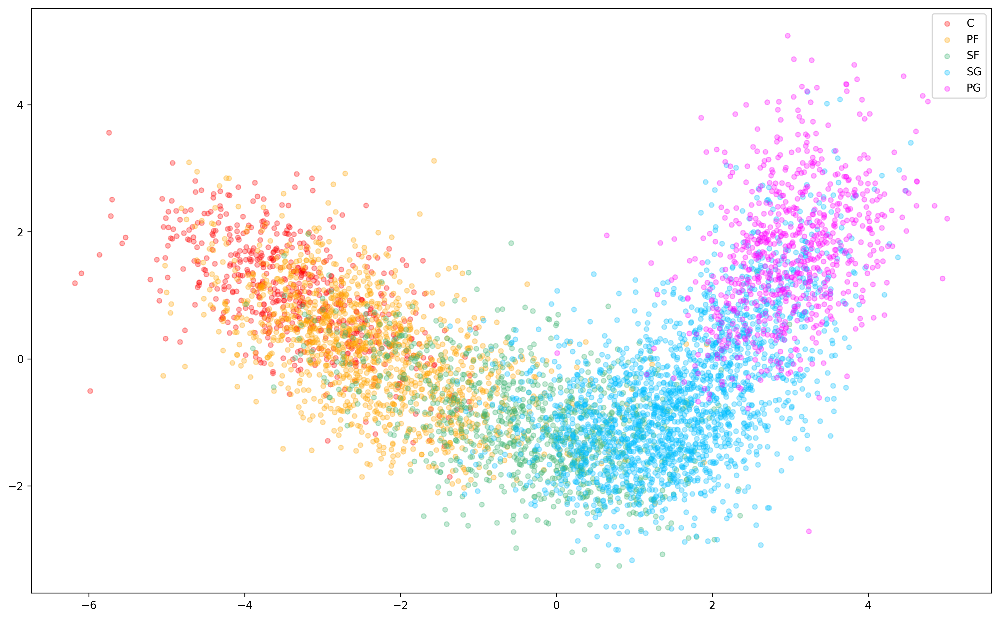

In [14]:
plt.figure(figsize=(16,10),dpi=300)
plt.scatter(ldaDf[ldaDf["pos"]=="C"].iloc[:,0], ldaDf[ldaDf["pos"]=="C"].iloc[:,1], color="red", marker="o", s=20, alpha=0.3, label="C")
plt.scatter(ldaDf[ldaDf["pos"]=="PF"].iloc[:,0], ldaDf[ldaDf["pos"]=="PF"].iloc[:,1], color="orange", marker="o", s=20, alpha=0.3, label="PF")
plt.scatter(ldaDf[ldaDf["pos"]=="SF"].iloc[:,0], ldaDf[ldaDf["pos"]=="SF"].iloc[:,1], color="mediumseagreen", marker="o", s=20, alpha=0.3, label="SF")
plt.scatter(ldaDf[ldaDf["pos"]=="SG"].iloc[:,0], ldaDf[ldaDf["pos"]=="SG"].iloc[:,1], color="deepskyblue", marker="o", s=20, alpha=0.3, label="SG")
plt.scatter(ldaDf[ldaDf["pos"]=="PG"].iloc[:,0], ldaDf[ldaDf["pos"]=="PG"].iloc[:,1], color="magenta", marker="o", s=20, alpha=0.3, label="PG")
plt.legend()
plt.show()

### 기존 포지션에 대한 실루엣 coefficient

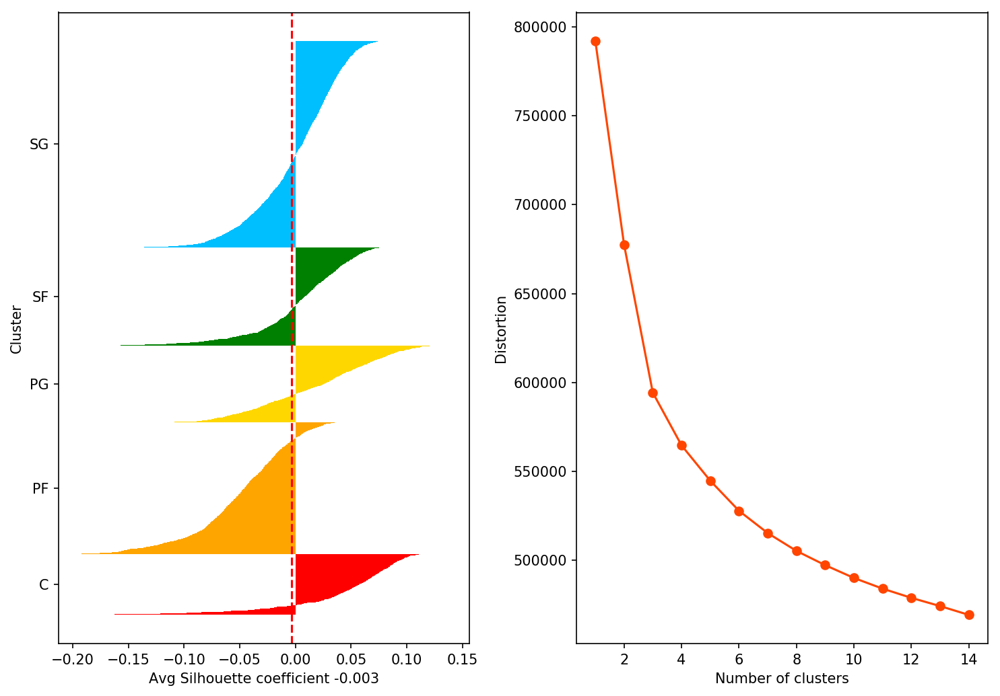

In [20]:
silhouette_plot(dfX, dfy)

## 10개로 포지션을 재정의한 후 시각화

In [15]:
del ldaDf["pos"]

In [16]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=10, init="random", algorithm="full").fit(ldaDf)

In [17]:
model = model.predict(ldaDf)

In [18]:
ldaDf["cluster"] = model

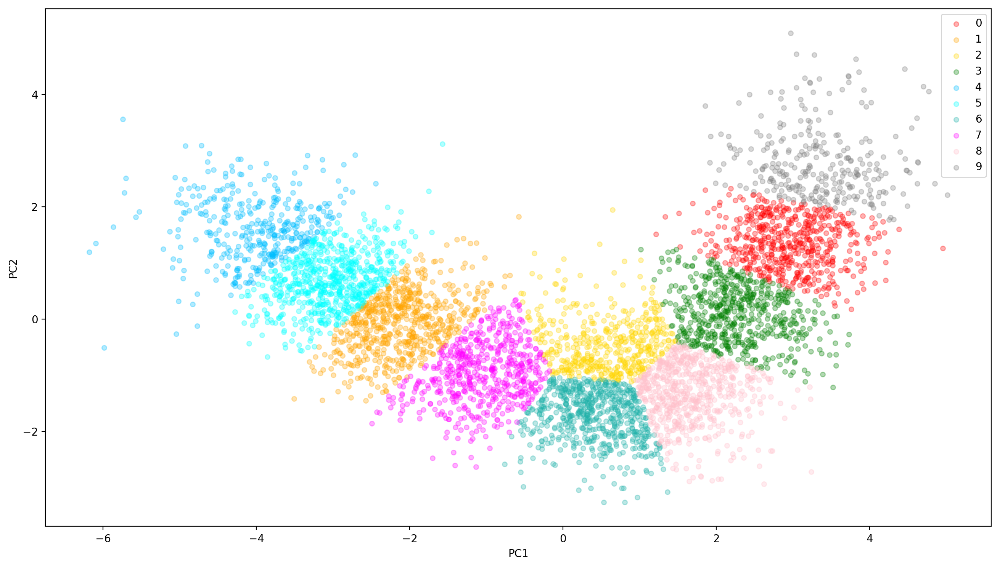

In [19]:
position_plot(ldaDf, 10)

### 재정의한 포지션에 대한 실루엣 coefficient

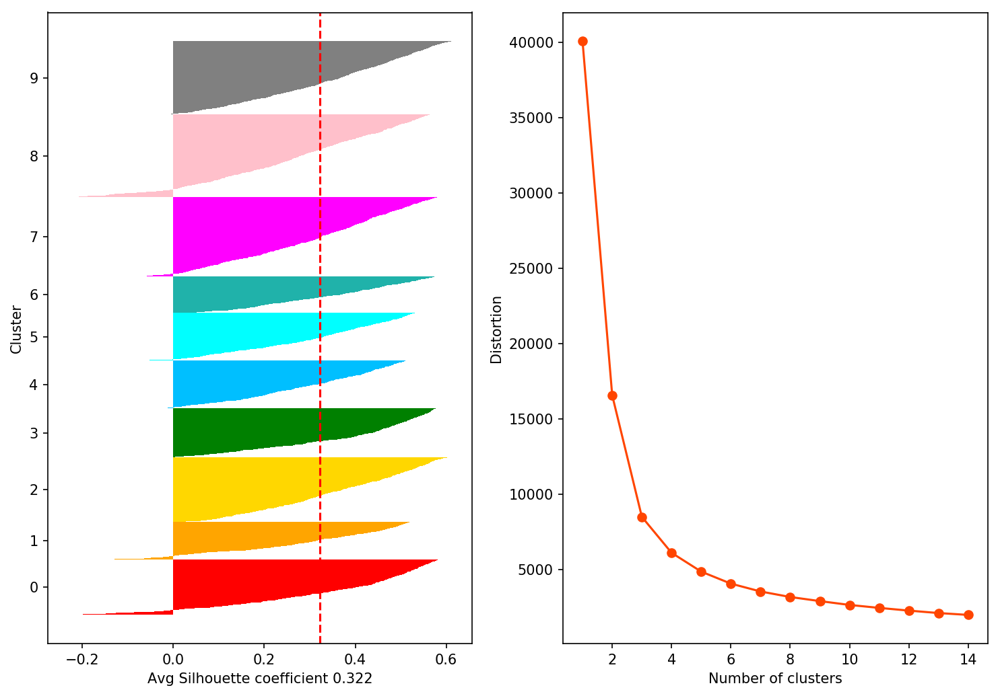

In [42]:
silhouette_plot(ldaDf.iloc[:,:2], model)

### 클러스터 특징 파악 

In [43]:
ldaDf["cluster"].value_counts()

8    784
7    745
9    692
2    606
0    527
3    466
5    451
4    450
1    355
6    348
Name: cluster, dtype: int64

In [44]:
dfX["cluster"] = ldaDf["cluster"]

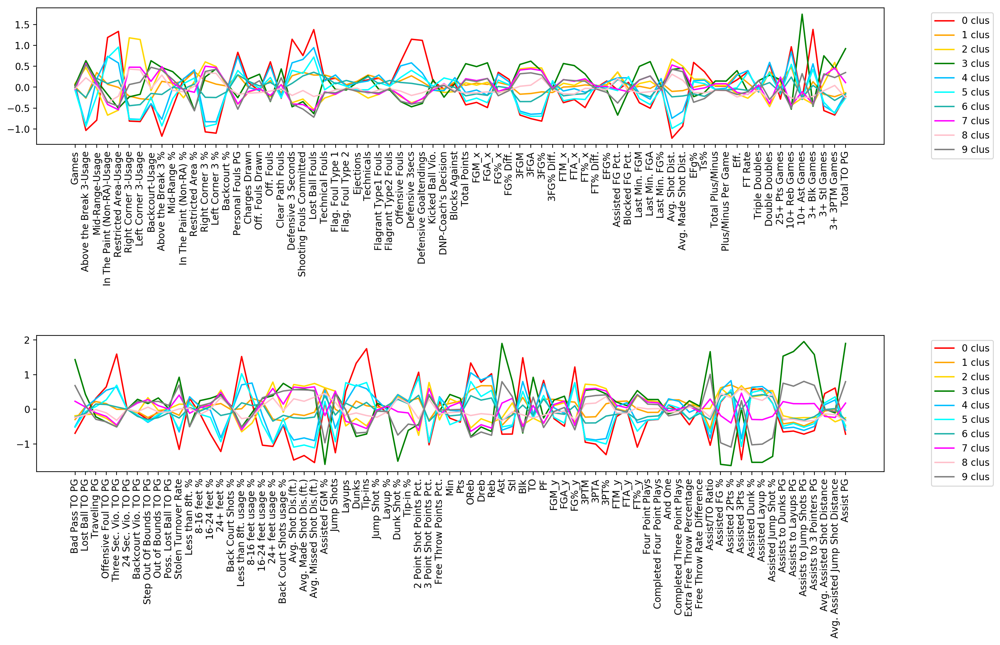

In [45]:
cluster_plot(dfX, 10)

### 클러스터링 모형 최적화 

In [46]:
from sklearn.model_selection import GridSearchCV 

def silhouette_score(estimator, X):
    from sklearn.metrics import silhouette_samples   
    
    clusters = estimator.fit_predict(X)
    silhouette_vals = silhouette_samples(X, clusters, metric="euclidean")
    score = np.mean(silhouette_vals)
    return score

kms = KMeans()
param_init = ["k-means++", "random"]
param_algo = ["auto", "full"]
param_grid = {"n_clusters": range(8, 15), "init" : param_init, "algorithm" : param_algo}

gs = GridSearchCV(kms, param_grid = param_grid, scoring=silhouette_score, n_jobs=1)
X = ldaDf.iloc[:,:2]
gs.fit(X)

GridSearchCV(cv=None, error_score='raise',
       estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'init': ['k-means++', 'random'], 'algorithm': ['auto', 'full'], 'n_clusters': [8, 9, 10, 11, 12, 13, 14]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring=<function silhouette_score at 0x000000002677F128>,
       verbose=0)

In [47]:
gs.best_params_

{'algorithm': 'auto', 'init': 'k-means++', 'n_clusters': 8}

In [48]:
gs.best_score_

0.35201790127527732

In [49]:
n = len(gs.cv_results_["mean_test_score"])
for i in range(n):
    print(gs.cv_results_["params"][i] , " --- " , gs.cv_results_["mean_test_score"][i])

({'init': 'k-means++', 'n_clusters': 8, 'algorithm': 'auto'}, ' --- ', 0.35201790127527732)
({'init': 'k-means++', 'n_clusters': 9, 'algorithm': 'auto'}, ' --- ', 0.34112176554622597)
({'init': 'k-means++', 'n_clusters': 10, 'algorithm': 'auto'}, ' --- ', 0.34071825293969132)
({'init': 'k-means++', 'n_clusters': 11, 'algorithm': 'auto'}, ' --- ', 0.33114709151924804)
({'init': 'k-means++', 'n_clusters': 12, 'algorithm': 'auto'}, ' --- ', 0.33067203641795151)
({'init': 'k-means++', 'n_clusters': 13, 'algorithm': 'auto'}, ' --- ', 0.3309057047560624)
({'init': 'k-means++', 'n_clusters': 14, 'algorithm': 'auto'}, ' --- ', 0.33053911509859552)
({'init': 'random', 'n_clusters': 8, 'algorithm': 'auto'}, ' --- ', 0.35166470909445929)
({'init': 'random', 'n_clusters': 9, 'algorithm': 'auto'}, ' --- ', 0.34119740016722133)
({'init': 'random', 'n_clusters': 10, 'algorithm': 'auto'}, ' --- ', 0.34051188726474085)
({'init': 'random', 'n_clusters': 11, 'algorithm': 'auto'}, ' --- ', 0.3420985056637

--------

---------

# 덴드로그램

In [40]:
clusDf = ldaDf.iloc[:,:2]

In [41]:
from scipy.cluster.hierarchy import linkage
from scipy.spatial.distance import pdist, squareform

row_clusters = linkage(pdist(clusDf, metric="euclidean"), method="complete")

In [42]:
from scipy.cluster.hierarchy import dendrogram
plt.figure(figsize=(5,15), labels=ldaDf["dfy"])
dendrogram(row_clusters, orientation="right")
plt.tight_layout()
plt.show()

KeyError: 'dfy'

# affinity propagation

In [43]:
from sklearn.cluster import AffinityPropagation
from sklearn import metrics

In [44]:
af = AffinityPropagation(preference=-5).fit(clusDf)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(clusDf, labels, metric='euclidean'))

Estimated number of clusters: 1136
Silhouette Coefficient: 0.140


# EM clustering

In [112]:
clusDf = ldaDf.iloc[:,:2]

In [113]:
from sklearn import mixture
import pandas as pd

em = mixture.GMM(n_components=10)
y = em.fit_predict(clusDf) 

print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(clusDf, y, metric='euclidean'))
silhouette_vals = silhouette_samples(clusDf, y, metric="euclidean")
silhouette_vals

C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:52: DeprecationWarning: Class GMM is deprecated; The class GMM is deprecated in 0.18 and will be  removed in 0.20. Use class GaussianMixture instead.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:70: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The functon distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:70: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
C:\Users\hapro\Anaconda2\lib\site-packages\sklearn\utils\deprecation.py:70: DeprecationWarning: Func

NameError: name 'metrics' is not defined

In [47]:
pd.Series(y).value_counts()

5    831
0    802
6    665
4    580
9    554
1    554
7    547
3    489
2    333
8     69
dtype: int64

In [48]:
ldaDf["cluster"] = y

In [ ]:
position_plot(ldaDf, 10)

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:23: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index


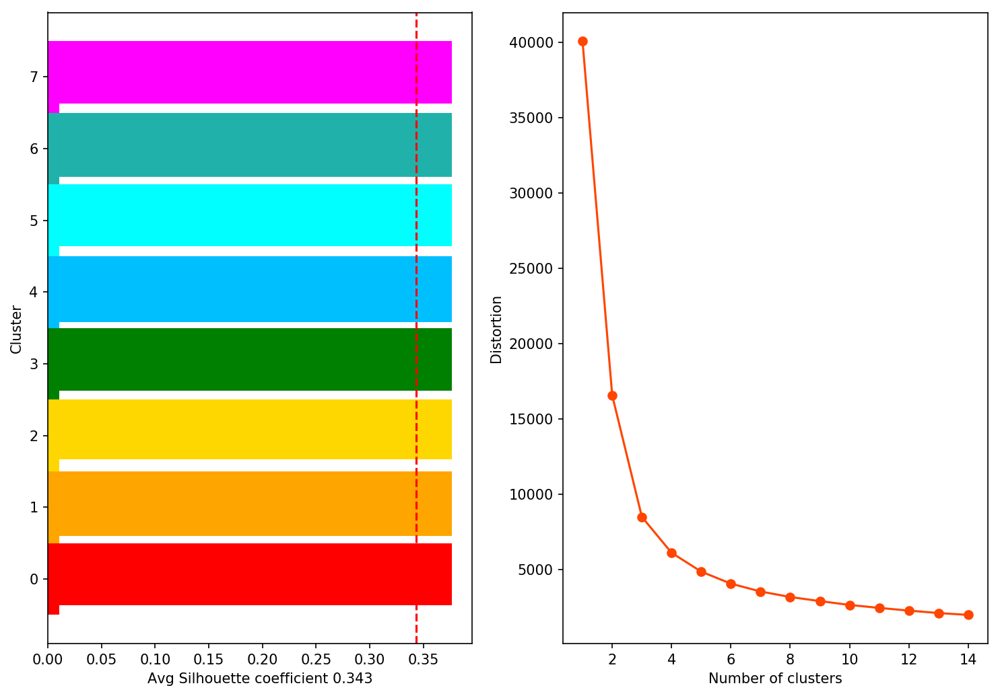

In [30]:
silhouette_plot(ldaDf.iloc[:,:2], ldaDf["cluster"])

In [31]:
dfX["cluster"] = y
cluster_plot(dfX, 10)

NameError: name 'y' is not defined

--------

## 계층적 클러스터링

In [32]:
# 계층 클러스터링을 수행하고 군집의 개수를 선택할 수 있게 해준다. 
from sklearn.cluster import AgglomerativeClustering

ac = AgglomerativeClustering(n_clusters=10, affinity="euclidean", linkage="ward")
labels = ac.fit_predict(clusDf)
print("Cluster labels : %s" %labels)

NameError: name 'clusDf' is not defined

In [33]:
ldaDf["cluster"] = labels

NameError: name 'labels' is not defined

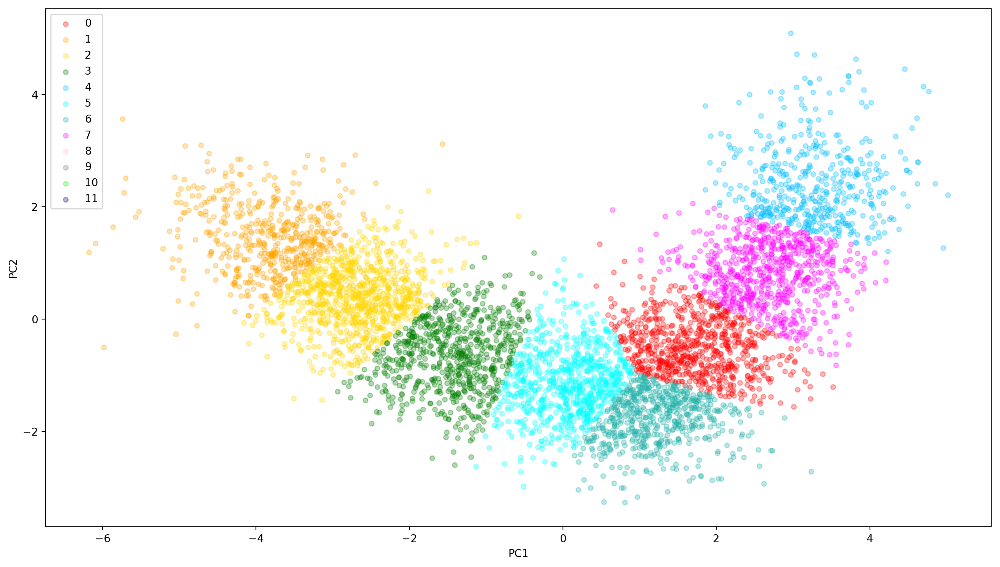

In [37]:
position_plot(ldaDf, 12)

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:23: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
Exception KeyboardInterrupt in <function remove at 0x0000000015B66DD8> ignored


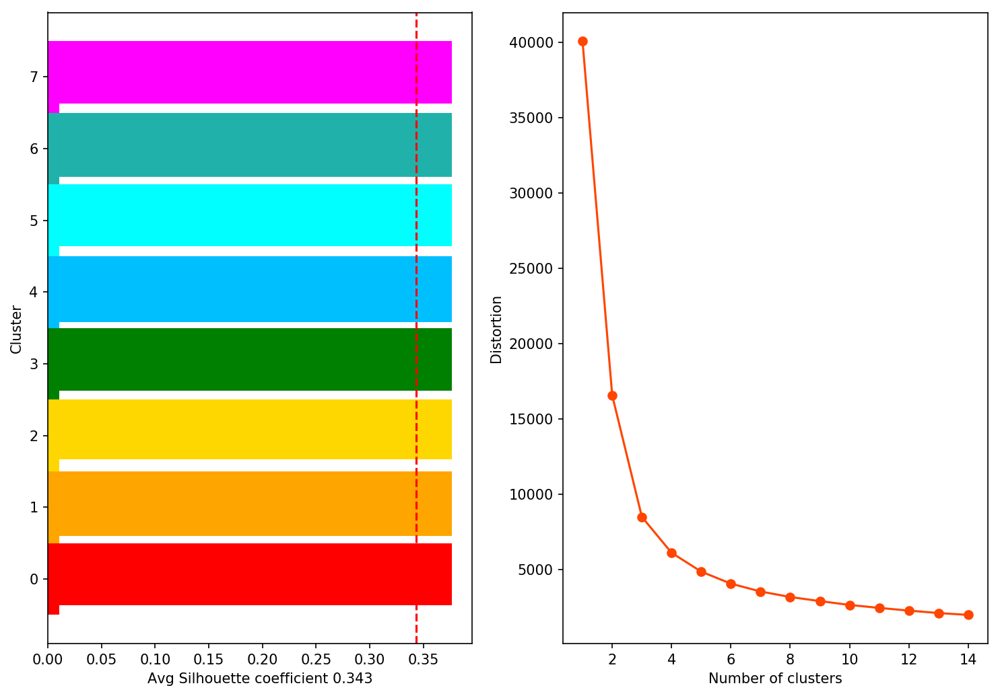

In [35]:
silhouette_plot(ldaDf.iloc[:,:2], ldaDf["cluster"])

In [ ]:
dfX["cluster"] = ldaDf["cluster"]
cluster_plot(dfX, 10)

# 회의한 내용

###

- 0번 : 평균이하로 뜀 / 3점(x) / assisted dunk, 2point : 제일 높음 / 블록이 제일 높음 / 리바, 팁인 , 루즈볼 파울 / 슈팅파울 / 
       수비형 센터
- 7번 : assisted 2 point 제일 높음 / 3점 그 다음번으로 없으며 / 블락은 2번째 / 0번 보다 득점이 주로 / 수비형 파워포워드

- 2번 :  assisted 3점(3번째) , 덩크(1번째) / assist2점이 제일 높고 / 블락 3번째 / 오펜리바 3번째 / assisted layup 3번째 / assisted field-goal 1번째 / 리바 3번째 / 디펜스 리바 2번째 / 포인트 전체 2위 / 미드레인지 1위 : 노비츠키 스타일

- 9번 : 블락 4번째 / 오펜스 리바 4등 / 팁인 / 디펜 리바 4등 / 3점x / 득점력 평균 이하 / 주워먹기 위주

- 5번 : 출전시간 평균 / assisted 3점 1등 / assisted duck 4 등 / assistd 2점샷 4등 / 3점 밖 5등 / assisted 점프샷 2등 / 디펜스 리바 중간정도 / 득점 평균 , 스틸 평균 /  : 밸런스 플레이어 / assisted 필드골 3등

- 4번 : 덩트 x / 3점 밖에서 던지는 비율 5등 / 3점 made 5위 / 어시스트 평균 / 3pta 5위 / 팁인, 레이업 없음 / 어시스트 적당 / 점프샷 3등 / 샷 거리 3등 / 3점슛 성공률 4등 / 25점 이상 2등 

- 8번 : assisted 3점 2등 / assisted dunk 5등 / 코너 가장 많이 / assisted2점 중간 / 3점슛 밖 2등 / 3점 슛 1등 / 리바 팁은 뒤에서 4등 정도 / 레이업 4등 / 필드골 2등 / 점프샷 3등 / 블락(x) / 어시스트 거의 없음 / 3점슛 메이드 3등 / 메이드 샷 거리 1등 / 3점 슛 성공률 1위 / 득점력 4등 / 스틸 4등 / 

- 1번 : assisted3점 4등 / assisted 덩크 꼴찌 / 코너 2등 / assisted 2포인트 뒤에서 2등 / assist 점프샷 3등 / assist 3등 /레이업, 리바,  블락(x) / 3점슛 시도 제일 높음 /  필드골 뒤에서 3등 / 점프샷 뒤에서 3등 / 루즈볼 파울 제일 없음 / 레이업 어시스트 3위 / 
3점슛 시도 2위, 성공률 2위,득점 3위,스틸 2위, 25포인트 이상 득점 1위,파울은 2번째로 적은편, 배드 패스 3위 : 어시스트와 3점을 같이하는 플레이어(dual guard)
 
- 6번 : assisted 3점이 높지 않은 편 / left corner 3위 / assisted 2points 뒤에서 2등 / assist to jump 2위 / 3점밖에서 쏘는 것 4등 / 3점슛 메이드 4등 / 어시스트 2등 / 블록뒤에서 2번째 / 3점슛 시도 4위 / 오펜스 리바(x) / 팁인 뒤에서 2등, 레이업 2등, 필드골 뒤에서 2등, 블락도 뒤에서 2등 / 루즈볼 파울 뒤에서 2등 / 어시 10개 이상 2등 / 3점 라인 빼주는 것 2위/ 덩크로 빼주는 것 2위 / 리바운드 뒤에서 2등 / 레이버 주는 것 2등 / 3점슛 메이드 4위 / 점프샷 5위 / 배드패스 2위 / 메이드 샷 4위 / 3점슛 성공률 6위 , 시도 4위 / 스틸 3위
레이업 평균

- 3번 : 출전시간 1위 / 3점슛 평균 / 덩크 꼴찌 / 코너 4등 / 2포인트 꼴찌  / 어시스트 1위 / 3점 슛 밖 활동 2위 / 3점 시도 3위 / 오펜스 리바 뒤에서 3등 / 팁인 꼴찌 / 플락 꼴등 / 코너 거의 안감 / 3점슛 메이드 1위 / 점프샷 4위 / 3점 성공률 3위 / 3점슛 시도 1위 / 포인트 1위 / 스틸 1위 / 

# 선수별 분포도 추가

In [20]:
player_list = data.Player.reset_index()
del player_list["index"]

In [21]:
Season_list = data.Season.reset_index()
del Season_list["index"]

In [22]:
ldaDf["name"] = player_list

In [23]:
ldaDf["season"] = Season_list

In [24]:
show_list = ["Kawhi Leonard","LeBron James","Anthony Davis","James Harden","Russell Westbrook","Kevin Durant","Giannis Antetokounmpo","Rudy Gobert","Stephen Curry","Isaiah Thomas","Jimmy Butler","Draymond Green","DeAndre Jordan","John Wall","DeMar DeRozan"]

In [25]:
def position_plot1(df, n, player_list):
    c = ["red", "orange", "gold", "green", "deepskyblue", "cyan", "lightseagreen", "magenta", "pink", 
             "grey", "lime", "navy", "violet", "olive"]
    plt.figure(figsize=(16,9),dpi=200)
    for i in range(n) :
        plt.scatter(ldaDf[ldaDf["cluster"]==i].iloc[:,0], ldaDf[ldaDf["cluster"]==i].iloc[:,1], color=c[i], marker="o", s=20, alpha=0.3, label=str(i))
        plt.legend()
    
    for i in show_list:
        for j in ldaDf[ldaDf.name == i].index:
            plt.annotate("%s %s"%(i,ldaDf.iloc[j,:][4]),(ldaDf.iloc[j,:][0],ldaDf.iloc[j,:][1]),xytext=(ldaDf.iloc[j,:][0]-0.1,ldaDf.iloc[j,:][1]), fontsize=8)

    plt.xlabel("PC1")
    plt.ylabel("PC2")

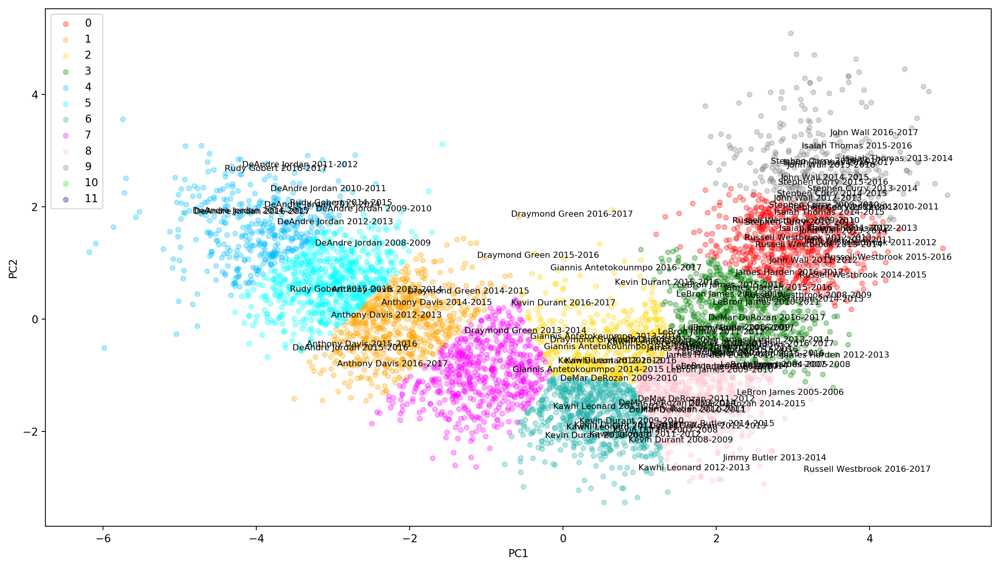

In [26]:
position_plot1(ldaDf,12,player_list)

# 우승별 시각화

In [27]:
champ_list = pd.read_csv("champ4.csv")
champ_list

,year,team,member1,member2,member3,member4,member5,member6
0,1997,bulls,michael jordan,scottie pippen,dennis rodman,toni kukoc,luc longley,ron harper
1,1998,spurs,tim duncan,avery johnson,david robinson,sean elliott,mario elie,NaN
2,1999,lakers,shaquille oneal,kobe bryant,glen rice,ron harper,ac green,derek fisher
3,2000,lakers,kobe bryant,shaquille oneal,derek fisher,horace grant,rick fox,ron harper
4,2001,lakers,kobe bryant,shaquille oneal,rick fox,derek fisher,samaki walker,robert horry
5,2002,spurs,tim duncan,tony parker,bruce bowen,stephen jackson,david robinson,NaN
6,2003,pistons,ben wallace,richard hamilton,chauncey billups,tayshaun prince,rasheed wallace,mehmet okur
7,2004,spurs,tony parker,tim duncan,bruce bowen,manu ginobili,rasho nesterovic,NaN
8,2005,heat,dwayne wade,jason williams,udonis haslem,shaquille oneal,james posey,gary payton
9,2006,spurs,tim duncan,tony parker,bruce bowen,manu ginobili,michael finley,brent barry


In [123]:
data

,Player,Team,Season,Season Type,Games,Above the Break 3-Usage,Mid-Range-Usage,In The Paint (Non-RA)-Usage,Restricted Area-Usage,Right Corner 3-Usage,Left Corner 3-Usage,Backcourt-Usage,Above the Break 3 %,Mid-Range %,In The Paint (Non-RA) %,Restricted Area %,Right Corner 3 %,Left Corner 3 %,Backcourt %,Personal Fouls PG,Charges Drawn,Off. Fouls Drawn,Off. Fouls,Clear Path Fouls,Defensive 3 Seconds,Shooting Fouls Committed,Lost Ball Fouls,Technical Fouls,Flag. Foul Type 1,Flag. Foul Type 2,Ejections,Technicals,Flagrant Type1 Fouls,Flagrant Type2 Fouls,Offensive Fouls,Defensive 3secs,Defensive Goaltendings,Kicked Ball Vio.,DNP-Coach's Decision,Blocks Against,Total Points,FGM_x,FGA_x,FG%_x,FG% Diff.,3FGM,3FGA,3FG%,3FG% Diff.,FTM_x,FTA_x,FT%_x,FT% Diff.,EFG%,Assisted FG Pct.,Blocked FG Pct.,Last Min. FGM,Last Min. FGA,Last Min. FG%,Avg. Shot Dist.,Avg. Made Shot Dist.,EFg%,Ts%,Total Plus/Minus,Plus/Minus Per Game,Eff.,FT Rate,Triple Doubles,Double Doubles,25+ Pts Games,10+ Reb Games,10+ Ast Games,3+ Blk Games,3+ Stl Games,3+ 3PTM Games,Total TO PG,Bad Pass TO PG,Lost Ball TO PG,Traveling PG,Offensive Foul TO PG,Three Sec. Vio. TO PG,24 Sec. Vio. TO PG,Backcourt Vio. TO PG,Step Out Of Bounds TO PG,Out of Bounds TO PG,Poss. Lost Ball TO PG,Stolen Turnover Rate,Less than 8ft. %,8-16 feet %,16-24 feet %,24+ feet %,Back Court Shots %,Less than 8ft. usage %,8-16 feet usage %,16-24 feet usage %,24+ feet usage %,Back Court Shots usage %,Avg. Shot Dis.(ft.),Avg. Made Shot Dis.(ft.),Avg. Missed Shot Dis.(ft.),Assisted FGM %,Jump Shots,Layups,Dunks,Tip-ins,Jump Shot %,Layup %,Dunk Shot %,Tip-in %,2 Point Shot Points Pct.,3 Point Shot Points Pct.,Free Throw Points Pct.,Min,Pts,OReb,Dreb,Reb,Ast,Stl,Blk,TO,PF,FGM_y,FGA_y,FG%_y,3PTM,3PTA,3PT%,FTM_y,FTA_y,FT%_y,Four Point Plays,Completed Four Point Plays,And One,Completed Three Point Plays,Extra Free Throw Percentage,Free Throw Rate Difference,Assist/TO Ratio,Assisted FG %,Assisted 2Pts %,Assisted 3Pts %,Assisted Dunk %,Assisted Layup %,Assisted Jump Shot %,Assists to Dunks PG,Assists to Layups PG,Assists to Jump Shots PG,Assists to 3 Pointers PG,Avg. Assisted Shot Distance,Avg. Assisted Jump Shot Distance,Assist PG,Pos
1,Kobe Bryant,Lakers,2005-2006,REG,80,21.72,44.91,10.45,20.75,1.15,0.87,0.14,0.350,0.424,0.493,0.601,0.280,0.474,0.000,2.91,0,12,48,0,0,112,12,12,2,0,0,12,2,0,48,0,1,4,0,82,167,48,132,0.364,-0.086,7,32,0.219,-0.129,64,76,0.842,-0.008,0.390,0.229,0.038,12,42,0.286,16.49,14.69,0.491,0.559,320,4.00,27.83,0.320,0,4,68,2,2,0,24,33,3.13,0.83,0.95,0.18,0.60,0.01,0,0.04,0.11,0.28,0.08,0.51,0.579,0.454,0.421,0.351,0.000,25.49,17.63,33.00,23.70,0.18,14.74,13.00,16.16,43.76,79.52,17.44,2.85,0.18,0.411,0.546,0.952,0.250,56.36,19.07,24.58,40.96,35.40,0.89,4.43,5.31,4.50,1.84,0.38,3.13,2.91,12.23,27.16,0.450,2.25,6.48,0.347,8.70,10.24,0.850,1.0,1.0,67.0,56.0,0.838,-0.012,1.440,43.76,37.72,70.56,64.41,27.05,46.98,0.70,1.08,2.73,1.43,10.74,17.65,4.50,SG
8,Kevin Durant,Thunder,2013-2014,REG,81,27.43,30.15,16.29,24.47,1.13,0.47,0.06,0.391,0.444,0.404,0.775,0.368,0.500,0.000,2.15,0,8,22,1,1,118,4,16,0,0,0,16,0,0,22,1,2,8,1,42,167,50,132,0.379,-0.124,20,52,0.385,-0.006,47,57,0.825,-0.049,0.455,0.440,0.030,15,44,0.341,17.16,16.24,0.560,0.635,509,6.28,31.75,0.417,3,27,69,23,7,4,9,35,3.52,1.52,1.10,0.12,0.27,0.00,0,0.00,0.01,0.26,0.06,0.67,0.666,0.445,0.445,0.392,0.000,33.35,23.05,14.51,29.03,0.06,13.30,10.91,15.72,47.23,77.49,13.51,8.77,0.24,0.419,0.671,0.986,0.500,50.67,22.21,27.11,38.54,32.01,0.72,6.67,7.38,5.49,1.27,0.73,3.52,2.15,10.48,20.84,0.503,2.37,6.06,0.391,8.68,9.94,0.873,3.0,3.0,64.0,57.0,0.896,0.022,1.561,47.23,44.75,55.73,68.49,39.22,43.98,1.17,1.07,3.25,1.41,9.67,15.54,5.49,SG
10,Russell Westbrook,Thunder,2016-2017,REG,81,27.73,30.67,8.61,30.67,0.72,1.55,0.05,0.338,0.363,0.401,0.573,0.143,0.533,0.000,2.35,3,9,29,0,0,81,14,13,2,0,1,13,2,0,29,0,2,2,1,90,247,82,184,0.446,0.021,19,58,0.328,-0.015,64,75,0.853,0.008,0.497,0.061,0.049,24,65,0.369,14.95,12.65,0.476,0.554,251,3.10,33.96,0.366,42

In [28]:
team_list = data.Team.reset_index()
del team_list["index"]

In [29]:
ldaDf["Team"] = team_list

In [30]:
ldaDf

,0,1,cluster,name,season,Team
0,1.122759,-0.533908,2,Kobe Bryant,2005-2006,Lakers
1,0.742184,-0.408697,2,Kevin Durant,2013-2014,Thunder
2,3.239089,-2.714015,8,Russell Westbrook,2016-2017,Thunder
3,1.124866,-0.529501,2,Kobe Bryant,2006-2007,Lakers
4,2.366182,-1.347205,8,LeBron James,2005-2006,Cavaliers
5,2.257586,1.434031,0,Dwyane Wade,2008-2009,Heat
6,0.311946,-1.856439,6,Kevin Durant,2009-2010,Thunder
7,2.905726,2.394695,9,Stephen Curry,2015-2016,Warriors
8,2.015300,-0.879667,8,Kobe Bryant,2002-2003,Lakers
9,2.452985,-0.851680,8,LeBron James,2007-2008,Cavaliers


In [31]:
ldaDf["name"] = ldaDf["name"].str.lower()
ldaDf["Team"] = ldaDf["Team"].str.lower()
ldaDf

,0,1,cluster,name,season,Team
0,1.122759,-0.533908,2,kobe bryant,2005-2006,lakers
1,0.742184,-0.408697,2,kevin durant,2013-2014,thunder
2,3.239089,-2.714015,8,russell westbrook,2016-2017,thunder
3,1.124866,-0.529501,2,kobe bryant,2006-2007,lakers
4,2.366182,-1.347205,8,lebron james,2005-2006,cavaliers
5,2.257586,1.434031,0,dwyane wade,2008-2009,heat
6,0.311946,-1.856439,6,kevin durant,2009-2010,thunder
7,2.905726,2.394695,9,stephen curry,2015-2016,warriors
8,2.015300,-0.879667,8,kobe bryant,2002-2003,lakers
9,2.452985,-0.851680,8,lebron james,2007-2008,cavaliers


In [32]:
def take(x):
    list = x.split("-")
    return list[0]

In [33]:
ldaDf["season"] = ldaDf["season"].map(take)

In [56]:
ldaDf = ldaDf.rename(columns = {"Team":"team","season":"year"})
ldaDf.head(10)

,0,1,cluster,name,year,team
0,1.122759,-0.533908,2,kobe bryant,2005,lakers
1,0.742184,-0.408697,2,kevin durant,2013,thunder
2,3.239089,-2.714015,8,russell westbrook,2016,thunder
3,1.124866,-0.529501,2,kobe bryant,2006,lakers
4,2.366182,-1.347205,8,lebron james,2005,cavaliers
5,2.257586,1.434031,0,dwyane wade,2008,heat
6,0.311946,-1.856439,6,kevin durant,2009,thunder
7,2.905726,2.394695,9,stephen curry,2015,warriors
8,2.015300,-0.879667,8,kobe bryant,2002,lakers
9,2.452985,-0.851680,8,lebron james,2007,cavaliers


In [55]:
champ_list.iloc[0,[0,1,2]] 

year                 1997
team                bulls
member1    michael jordan
Name: 0, dtype: object

In [59]:
a,b,c = champ_list.iloc[0,[0,1,2]] 

In [58]:
ldaDf.iloc[0,[3,4,5]]

name    kobe bryant
year           2005
team         lakers
Name: 0, dtype: object

In [60]:
c1,a1,b1 = ldaDf.iloc[0,[3,4,5]]

In [69]:
champ_list.columns

Index([u'year', u'team', u'member1', u'member2', u'member3', u'member4',
       u'member5', u'member6'],
      dtype='object')

In [100]:
ldaDf["year"]= ldaDf["year"].astype("int64")

In [83]:
ldaDf[ldaDf.name == champ_list.member1[1]][ldaDf.year == "2001"]

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


,0,1,cluster,name,year,team
74,-1.830821,0.894096,1,tim duncan,2001,spurs


In [76]:
champ_list.member1[2]

'shaquille oneal'

In [133]:
for i in range(len(champ_list)):
    for j in range(2,8):
        a = ldaDf[ldaDf.name == champ_list.iloc[:,j][i]][ldaDf.year == champ_list.year[i]]
        b = pd.concat([b,a])

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


In [134]:
b

,0,1,cluster,name,year,team
235,-2.572157,-0.231865,1,tim duncan,1998,spurs
17,1.599690,-0.814360,8,kobe bryant,2000,lakers
84,1.192694,0.127453,2,kobe bryant,2001,lakers
137,-2.762159,0.627069,5,tim duncan,2002,spurs
2535,-1.541333,-0.284934,1,ben wallace,2003,pistons
799,3.238497,1.212018,0,tony parker,2004,spurs
378,-2.835485,2.312761,4,tim duncan,2006,spurs
668,1.938971,-0.465958,3,ray allen,2007,celtics
485,-2.207991,0.925700,5,pau gasol,2008,lakers
43,1.466888,-0.378512,2,kobe bryant,2009,lakers


In [142]:
year_ascend =  b.sort(["year"])

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


In [146]:
year_ascend = year_ascend.drop_duplicates()

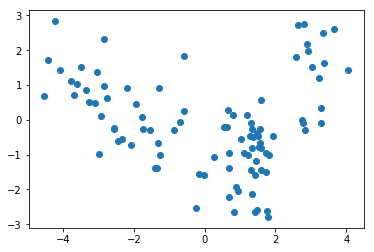

In [151]:
plt.scatter(year_ascend[0],year_ascend[1])

In [152]:
year_ascend

,0,1,cluster,name,year,team
2627,1.013606,-0.557278,2,ron harper,1997,bulls
1917,-3.051138,1.364668,5,luc longley,1997,bulls
1420,0.616436,-0.217786,2,toni kukoc,1997,bulls
235,-2.572157,-0.231865,1,tim duncan,1998,spurs
1975,0.690822,-2.219459,6,sean elliott,1998,spurs
2448,3.666441,2.600233,9,avery johnson,1998,spurs
2476,1.762157,-2.619087,8,mario elie,1998,spurs
3652,0.554760,-0.204855,2,ron harper,1999,lakers
920,0.936443,-2.053082,6,glen rice,1999,lakers
174,0.671005,0.277969,2,kobe bryant,1999,lakers


In [182]:
year_1 = year_ascend[year_ascend.year <2002]

In [183]:
year_2 = year_ascend[year_ascend.year <2007][year_ascend.year >=2002]

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


In [184]:
year_3 = year_ascend[year_ascend.year <2012][year_ascend.year >=2007]

C:\Users\hapro\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


In [185]:
year_4 = year_ascend[year_ascend.year >=2012]

In [213]:
def position_plot2(df, n):
    c = ["red", "orange", "gold", "green", "deepskyblue", "cyan", "lightseagreen", "magenta", "pink", 
             "grey", "lime", "navy", "violet", "olive"]
    
    plt.figure(figsize=(5,9),dpi=200)
    plt.subplot(511)
    for i in range(n) :
        plt.scatter(ldaDf[ldaDf["cluster"]==i].iloc[:,0], ldaDf[ldaDf["cluster"]==i].iloc[:,1], color=c[i], marker="o", s=20, alpha=0.3, label=str(i))
        plt.legend()
    
    x, y = find_boundary(x2_samples[:,0], x2_samples[:,1], n)
    ax.plot(x, y, '-k', lw=2.)
    
    plt.subplot(512)
    plt.scatter(year_1.iloc[:,0],year_1.iloc[:,1], marker="s", s=20,color="r", alpha=1)
    plt.title("1997-2001")
    plt.subplot(513)
    plt.scatter(year_2.iloc[:,0],year_2.iloc[:,1], marker="s", s=20,color="b", alpha=1)
    plt.title("2002-2006")
    plt.subplot(514)
    plt.scatter(year_3.iloc[:,0],year_3.iloc[:,1], marker="s", s=20,color="g", alpha=1)
    plt.title("2007-2011")
    plt.subplot(515)
    plt.scatter(year_4.iloc[:,0],year_4.iloc[:,1], marker="s", s=20,color="y", alpha=1)
    plt.title("2012-2016")
    plt.xlabel("PC1")
    plt.ylabel("PC2")

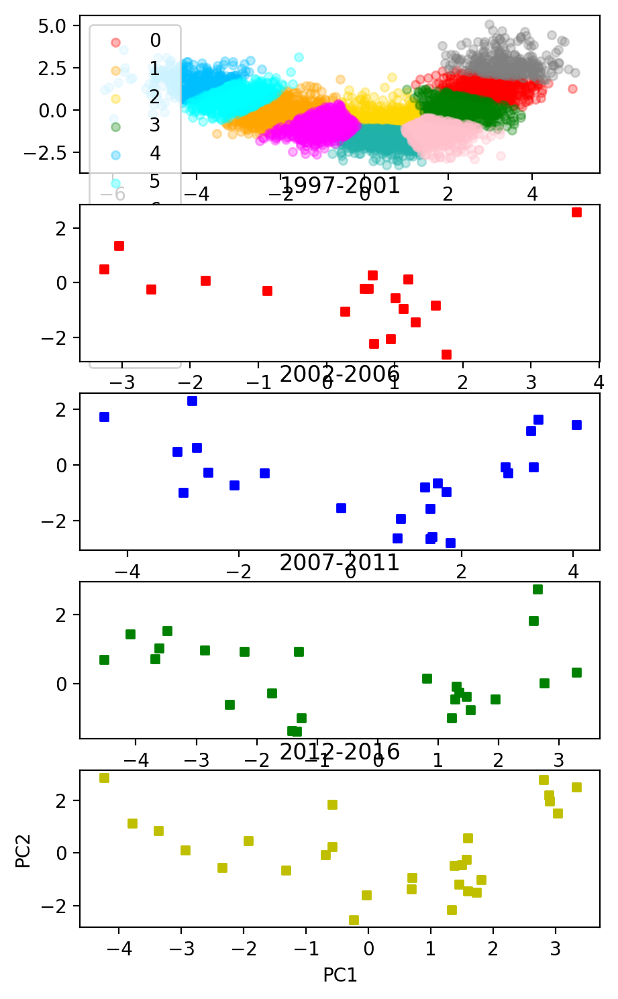

In [214]:
position_plot2(ldaDf,12)

In [186]:
year_1.iloc[:,1]

2627   -0.557278
1917    1.364668
1420   -0.217786
235    -0.231865
1975   -2.219459
2448    2.600233
2476   -2.619087
3652   -0.204855
920    -2.053082
174     0.277969
17     -0.814360
3856   -1.435274
2508   -0.946176
2946    0.073150
3786    0.510132
3729   -0.288479
84      0.127453
3214   -1.057148
Name: 1, dtype: float64

In [215]:
year_ascend

,0,1,cluster,name,year,team
2627,1.013606,-0.557278,2,ron harper,1997,bulls
1917,-3.051138,1.364668,5,luc longley,1997,bulls
1420,0.616436,-0.217786,2,toni kukoc,1997,bulls
235,-2.572157,-0.231865,1,tim duncan,1998,spurs
1975,0.690822,-2.219459,6,sean elliott,1998,spurs
2448,3.666441,2.600233,9,avery johnson,1998,spurs
2476,1.762157,-2.619087,8,mario elie,1998,spurs
3652,0.554760,-0.204855,2,ron harper,1999,lakers
920,0.936443,-2.053082,6,glen rice,1999,lakers
174,0.671005,0.277969,2,kobe bryant,1999,lakers


In [216]:
year_ascend.to_csv("champ_sort.csv")